In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

Path = 'C:/Users/gadge/OneDrive/Desktop/MachineLearning/Project'

In [2]:
file_path = Path + '/Data/NYTimes_Bestsellers_raw_data'
df= pd.read_csv(file_path+"/NYTimesBestsellers.csv")

In [3]:
df.head()

,Unnamed: 0,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,price,title,author
0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,0.0,WHERE THE CRAWDADS SING,Delia Owens
1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,0.0,CHOPPY WATER,Stuart Woods
2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,0.0,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo
3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,0.0,A PRIVATE CATHEDRAL,James Lee Burke
4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,0.0,THE VANISHING HALF,Brit Bennett


In [4]:
df.shape

(14190, 11)

### Data Cleaning

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14190 entries, 0 to 14189
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      14190 non-null  int64  
 1   genre           14190 non-null  object 
 2   published_date  14190 non-null  object 
 3   rank            14190 non-null  int64  
 4   rank_last_week  14190 non-null  int64  
 5   weeks_on_list   14190 non-null  int64  
 6   publisher       14190 non-null  object 
 7   description     12900 non-null  object 
 8   price           14190 non-null  float64
 9   title           14190 non-null  object 
 10  author          14190 non-null  object 
dtypes: float64(1), int64(4), object(6)
memory usage: 1.2+ MB


The data is mostly filled. There are some issues that need to be addressed.
- published_date must be of datetime data type
- description has some null values

In [6]:
# changing published_date to datetime
df['published_date'] = pd.to_datetime(df['published_date'])

In [7]:
#investigating the case of description missing values
df[df['description'].isnull()]

,Unnamed: 0,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,price,title,author
90,90,advice-how-to-and-miscellaneous,2020-08-30,1,1,41,HarperOne,NaN,0.0,"THE BOY, THE MOLE, THE FOX AND THE HORSE",Charlie Mackesy
91,91,advice-how-to-and-miscellaneous,2020-08-30,2,0,1,WaterBrook,NaN,0.0,THE LAZY GENIUS WAY,Kendra Adachi
92,92,advice-how-to-and-miscellaneous,2020-08-30,3,4,40,Avery,NaN,0.0,ATOMIC HABITS,James Clear
93,93,advice-how-to-and-miscellaneous,2020-08-30,4,6,3,Harper Wave,NaN,0.0,SUPERLIFE,Darin Olien
94,94,advice-how-to-and-miscellaneous,2020-08-30,5,9,10,Lioncrest,NaN,0.0,CAN'T HURT ME,David Goggins
95,95,advice-how-to-and-miscellaneous,2020-08-30,6,7,320,Northfield,NaN,0.0,THE FIVE LOVE LANGUAGES,Gary Chapman
96,96,advice-how-to-and-miscellaneous,2020-08-30,7,3,19,Morrow,NaN,0.0,"MAGNOLIA TABLE, VOL. 2",Joanna Gaines
97,97,advice-how-to-and-miscellaneous,2020-08-30,8,8,192,Harper,NaN,0.0,THE SUBTLE ART OF NOT GIVING A F*CK,Mark Manson
98,98,advice-how-to-and-miscellaneous,2020-08-30,9,10,27,WaterBrook,NaN,0.0,GET OUT OF YOUR HEAD,Jennie Allen
99,99,advice-how-to-and-miscellaneous,2020-08-30,10,0,218,Running Press,NaN,0.0,YOU ARE A BADASS,Jen Sincero


All the instances of missin description are of the list **advice-how-to-and-miscellaneous**. Checking if that's the case for all advice-how-to-and-miscellaneous books.

In [8]:
df[df['genre']=='advice-how-to-and-miscellaneous']['description'].count()

0

**rank** and **rank_last_week** are integers from 0 - 15

In [9]:
df[['rank','rank_last_week']].describe()

,rank,rank_last_week
count,14190.000000,14190.000000
mean,7.545455,4.920085
std,4.207580,4.400339
min,1.000000,0.000000
25%,4.000000,1.000000
50%,7.000000,4.000000
75%,11.000000,8.000000
max,15.000000,15.000000


In [10]:
df['weeks_on_list'].describe()

count    14190.000000
mean        35.734461
std         63.638853
min          1.000000
25%          2.000000
50%          8.000000
75%         37.000000
max        461.000000
Name: weeks_on_list, dtype: float64

In [11]:
df['publisher'].unique()

array(['Putnam', 'Grand Central', 'Simon & Schuster', 'Riverhead',
       'Morrow', 'Little, Brown', 'Harper', 'Atria',
       'Emily Bestler/Atria', 'Flatiron', 'Penguin Press', 'Celadon',
       'Threshold Editions', 'Dey St.', 'Random House', 'Dial',
       'One World', 'Beacon Press', 'Penguin', 'Vintage', 'Seal', 'Crown',
       'Knopf', 'Spiegel & Grau', 'Del Rey', 'Doubleday', 'Scribner',
       'Farrar, Straus & Giroux', 'Humanix', 'Ballantine', 'Minotaur',
       "St. Martin's Griffin", 'Ecco', 'Anchor', 'Hogarth', 'Back Bay',
       'Berkley', 'Beacon', 'New Press', 'Liveright', 'Tim Duggan',
       'Bold Type', 'Central Recovery', 'Milkweed Editions', 'HarperOne',
       'WaterBrook', 'Avery', 'Harper Wave', 'Lioncrest', 'Northfield',
       'Running Press', 'Balzer + Bray', 'Delacorte', 'jimmy patterson',
       'Margaret K. McElderry', 'HarperTeen', 'Quill Tree', 'Holt',
       'Gallery', 'Dutton', 'Harper Perennial', 'Crown Forum', 'Amulet',
       'Avon', 'Zebra', 'Custo

In [12]:
df[['description']]

,description
0,In a quiet town on the North Carolina coast in...
1,The 54th book in the Stone Barrington series. ...
2,A single mom teams up with an N.Y.P.D. detecti...
3,The 23rd book in the Dave Robicheaux series. R...
4,The lives of twin sisters who run away from a ...
5,A wedding between a TV star and a magazine pub...
6,A relationship that started in 1993 between Ma...
7,The 20th book in the Gabriel Allon series. The...
8,"After getting kicked out of M.I.T., Angela Hoo..."
9,"Ten years after her daughter disappears, a wom..."


In [13]:
df['price'].describe()

count    14190.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: price, dtype: float64

The price is just 0 everywhere. It is not filled so it's been dropped

In [14]:
df.drop('price',axis = 1,inplace = True)

In [15]:
df[['title']].drop_duplicates()

,title
0,WHERE THE CRAWDADS SING
1,CHOPPY WATER
2,THE MIDWIFE MURDERS
3,A PRIVATE CATHEDRAL
4,THE VANISHING HALF
5,THE GUEST LIST
6,28 SUMMERS
7,THE ORDER
8,1ST CASE
9,THEN SHE WAS GONE


In [16]:
df[['author']].drop_duplicates()

,author
0,Delia Owens
1,Stuart Woods
2,James Patterson and Richard DiLallo
3,James Lee Burke
4,Brit Bennett
5,Lucy Foley
6,Elin Hilderbrand
7,Daniel Silva
8,James Patterson and Chris Tebbetts
9,Lisa Jewell


There are issues with the author:
- Multiple authors (usually seperated by **and** or **with** or **,**)
- editors are included in the authors list

In [17]:
df['author'] = df['author'].apply(lambda x: re.sub(r'edited ',"",x))
df['authors'] = df['author'].apply(lambda x: re.split(r'\b and \b|\b with \b|\,', x))
df['#authors'] = df['authors'].apply(len)
df[['author','authors','#authors']]

,author,authors,#authors
0,Delia Owens,[Delia Owens],1
1,Stuart Woods,[Stuart Woods],1
2,James Patterson and Richard DiLallo,"[James Patterson, Richard DiLallo]",2
3,James Lee Burke,[James Lee Burke],1
4,Brit Bennett,[Brit Bennett],1
5,Lucy Foley,[Lucy Foley],1
6,Elin Hilderbrand,[Elin Hilderbrand],1
7,Daniel Silva,[Daniel Silva],1
8,James Patterson and Chris Tebbetts,"[James Patterson, Chris Tebbetts]",2
9,Lisa Jewell,[Lisa Jewell],1


In [18]:
df[['author','#authors']].drop_duplicates()['#authors'].value_counts()

1    1035
2     179
3      21
4       3
5       1
Name: #authors, dtype: int64

primary author and secondary author have been taken

In [19]:
df['primary_author'] = df['authors'].apply(lambda x: x[0])
df['secondary_author'] = df['authors'].apply(lambda x: x[1] if len(x)>1 else None)
df.head()

,Unnamed: 0,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author,authors,#authors,primary_author,secondary_author
0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,WHERE THE CRAWDADS SING,Delia Owens,[Delia Owens],1,Delia Owens,None
1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,CHOPPY WATER,Stuart Woods,[Stuart Woods],1,Stuart Woods,None
2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo,"[James Patterson, Richard DiLallo]",2,James Patterson,Richard DiLallo
3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,A PRIVATE CATHEDRAL,James Lee Burke,[James Lee Burke],1,James Lee Burke,None
4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,THE VANISHING HALF,Brit Bennett,[Brit Bennett],1,Brit Bennett,None


### Web Scraping

In [20]:
from bs4 import BeautifulSoup
import requests

In [21]:
books = df['title'].unique().tolist()
books

['WHERE THE CRAWDADS SING',
 'CHOPPY WATER',
 'THE MIDWIFE MURDERS',
 'A PRIVATE CATHEDRAL',
 'THE VANISHING HALF',
 'THE GUEST LIST',
 '28 SUMMERS',
 'THE ORDER',
 '1ST CASE',
 'THEN SHE WAS GONE',
 'NEAR DARK',
 'AMERICAN DIRT',
 'LITTLE FIRES EVERYWHERE',
 'THE SILENT PATIENT',
 'THE SILENT WIFE',
 'LIVE FREE OR DIE',
 'TOO MUCH AND NEVER ENOUGH',
 'FINDING FREEDOM',
 'CASTE',
 'UNTAMED',
 'HOW TO BE AN ANTIRACIST',
 'WHITE FRAGILITY',
 'EVIL GENIUSES',
 'THE TRUTHS WE HOLD',
 'THE WARMTH OF OTHER SUNS',
 'SO YOU WANT TO TALK ABOUT RACE',
 'THE SPLENDID AND THE VILE',
 'EDUCATED',
 'IT WAS ALL A LIE',
 'BORN A CRIME',
 'MEXICAN GOTHIC',
 'CAMINO WINDS',
 'IF IT BLEEDS',
 'LUSTER',
 'THE ANSWER IS ...',
 'BECOMING',
 'BETWEEN THE WORLD AND ME',
 'BLITZ',
 'THE ROOM WHERE IT HAPPENED',
 'BREATH',
 'BELOVED',
 'BEFORE WE WERE YOURS',
 'THE LONG CALL',
 'THE NIGHTINGALE',
 'THE SONG OF ACHILLES',
 'THIS TENDER LAND',
 'THE NICKEL BOYS',
 'THE WOMAN IN THE WINDOW',
 'CAJUN JUSTICE',
 'NO

In [22]:
def cased_text(text):
    return "_".join([i[0]+i[1:].lower() for i in text.split(" ")])

In [23]:
wikipedia_base = 'https://en.wikipedia.org/wiki/'

In [24]:
book_info = []
for book in books:
    print(book)
    url = wikipedia_base+cased_text(book)
    website = requests.get(url)
    if website.status_code == 200:
        soup = BeautifulSoup(website.text, 'html.parser')
        for link in soup.find_all('table'):
            if link.get('class'):
                if len(link.get('class')) > 1:
                    if ((link.get('class')[0] == 'infobox')&(link.get('class')[1] == 'vcard')):
                        for value in link.find_all('tr'):
                            if value.find('th') is not None:
                                if value.find('th').text == 'Author':
                                    author = value.find('td').text
                                if value.find('th').text == 'Genre':
                                    genre = value.find('td').text
                                if value.find('th').text == 'Publication date':
                                    original_publication = value.find('td').text
                                    book_dict = {'book':book,'author':author,'Genre':genre,"original_publication":original_publication}
                                    book_info.append(book_dict)

WHERE THE CRAWDADS SING
CHOPPY WATER
THE MIDWIFE MURDERS
A PRIVATE CATHEDRAL
THE VANISHING HALF
THE GUEST LIST
28 SUMMERS
THE ORDER
1ST CASE
THEN SHE WAS GONE
NEAR DARK
AMERICAN DIRT
LITTLE FIRES EVERYWHERE
THE SILENT PATIENT
THE SILENT WIFE
LIVE FREE OR DIE
TOO MUCH AND NEVER ENOUGH
FINDING FREEDOM
CASTE
UNTAMED
HOW TO BE AN ANTIRACIST
WHITE FRAGILITY
EVIL GENIUSES
THE TRUTHS WE HOLD
THE WARMTH OF OTHER SUNS
SO YOU WANT TO TALK ABOUT RACE
THE SPLENDID AND THE VILE
EDUCATED
IT WAS ALL A LIE
BORN A CRIME
MEXICAN GOTHIC
CAMINO WINDS
IF IT BLEEDS
LUSTER
THE ANSWER IS ...
BECOMING
BETWEEN THE WORLD AND ME
BLITZ
THE ROOM WHERE IT HAPPENED
BREATH
BELOVED
BEFORE WE WERE YOURS
THE LONG CALL
THE NIGHTINGALE
THE SONG OF ACHILLES
THIS TENDER LAND
THE NICKEL BOYS
THE WOMAN IN THE WINDOW
CAJUN JUSTICE
NORMAL PEOPLE
CIRCE
BEACH READ
THE NEW JIM CROW
JUST MERCY
THE COLOR OF LAW
THE BODY KEEPS THE SCORE
ON TYRANNY
STAMPED FROM THE BEGINNING
ALEXANDER HAMILTON
MY GRANDMOTHER'S HANDS
BRAIDING SWEETGRASS

THIS IS HOW THEY TELL ME THE WORLD ENDS
THE PRINCESS SPY
UNFINISHED
OUTLIERS
A RHYTHM OF PRAYER
THE BODY IS NOT AN APOLOGY, SECOND EDITION
THE GILDED ONES
A COURT OF SILVER FLAMES
RELENTLESS
MISSING AND ENDANGERED
HOW TO AVOID A CLIMATE DISASTER
THE SUM OF US
THE DAUGHTERS OF KOBANI
THE BLACK CHURCH
THE 20TH VICTIM
FLY AWAY
NOMADLAND
THE KAISER'S WEB
KINGDOM OF SHADOW AND LIGHT
TRIPLE CHOCOLATE CHEESECAKE MURDER
WE DO THIS 'TIL WE FREE US
ALL ABOUT LOVE
HOOD FEMINISM
BELIEVE IT
THE PEGAN DIET
INTUITIVE FASTING
DARE TO LEAD
LIFE AFTER DEATH
LATER
DARK SKY
THE AFFAIR
KLARA AND THE SUN
THE UNDERGROUND RAILROAD
LIGHTNING GAME
THE LOST APOTHECARY
HUNT, GATHER, PARENT
INFINITE COUNTRY
WHAT'S MINE AND YOURS
WE BEGIN AT THE END
THE COMMITTED
IN FIVE YEARS
THE COLDEST WINTER EVER
HIDDEN VALLEY ROAD
THE CHOICE
BEYOND ORDER
PROFESSIONAL TROUBLEMAKER
DUSK, NIGHT, DAWN
A WORLD WITHOUT EMAIL
CHAIN OF IRON
GOOD GIRL, BAD BLOOD
FAST ICE
THE ROSE CODE
2034
TRANSIENT DESIRES
THE CODE BREAKER
SPLIT SECON

THE BOYS
E.R. NURSES
THE BEATLES: GET BACK
IT'S BETTER TO BE FEARED
WHERE THE DEER AND THE ANTELOPE PLAY
RIGGED
SOME THINGS I STILL CAN'T TELL YOU
THE LAST DUEL
THE FOREVER DOG
THE KOREAN VEGAN COOKBOOK
GASTRO OBSCURA
THE DAILY LAWS
ARISTOTLE AND DANTE DIVE INTO THE WATERS OF THE WORLD
THE JUDGE'S LIST
DUNE
DEAR SANTA
OH WILLIAM!
OVER MY DEAD BODY
NOT ALL DIAMONDS AND ROSÉ
THE FIRST 21
THE BOOK OF HOPE
MUSIC IS HISTORY
IT WORKED FOR ME
THE PIONEER WOMAN COOKS--SUPER EASY!
THAT SOUNDS SO GOOD
BAKING WITH DORIE
WITHIN THESE WICKED WALLS
BETTER OFF DEAD
ARCHANGEL'S LIGHT
FORGIVING PARIS
GOING THERE
RENEGADES
BEST WISHES, WARMEST REGARDS
WOKE RACISM
CHRISTMAS IN PEACHTREE BLUFF
THE HOUSE OF GUCCI
CRAVINGS: ALL TOGETHER
HIP-HOP (AND OTHER THINGS)
COOKING AT HOME
RISE AND RUN
GAME ON
THE STRANGER IN THE LIFEBOAT
OUR COUNTRY FRIENDS
THE ATTIC ON QUEEN STREET
THE LYRICS: 1956 TO THE PRESENT
IMMUNE
THE PRESIDENT AND THE FREEDOM FIGHTER
WOKE UP THIS MORNING
BOTH/AND
WHOLEHEARTED FAITH
THE FAMILY

UPGRADE
THE BEST IS YET TO COME
HEAVEN OFFICIAL'S BLESSING: TIAN GUAN CI FU, VOL. 3
CONFESS
PORTRAIT OF AN UNKNOWN WOMAN
SHATTERED
GRACE UNDER FIRE
DIRTBAG, MASSACHUSETTS
ANY GIVEN TUESDAY
THE BODYGUARD
THE RETREAT
THE DAUGHTER OF DOCTOR MOREAU
MAYBE SOMEDAY
BAKE
THE WORLD'S WORST ASSISTANT
DO THE WORK!
THESE TWISTED BONDS
THE BIG LIE
THE LAST TO VANISH
STAR WARS: PADAWAN
VIOLET MADE OF THORNS
RECKONING
BLACK DOG
WRONG PLACE WRONG TIME
THE MANY DAUGHTERS OF AFONG MOY
MERCURY PICTURES PRESENTS
LONG LIVE THE PUMPKIN QUEEN
WILD IS THE WITCH
HEAT 2
THE FAMILY REMAINS
I'M GLAD MY MOM DIED
PATH LIT BY LIGHTNING
THE DESTRUCTIONISTS
LIFE ON THE MISSISSIPPI
EXISTENTIAL PHYSICS
AMERICA, A REDEMPTION STORY
SHY
THE LAST WHITE MAN
ALL GOOD PEOPLE HERE
THE CHALLENGE
OVERKILL
DIANA, WILLIAM, AND HARRY
VACUUMING IN THE NUDE
WHAT WE OWE THE FUTURE
STAR WARS: THE PRINCESS AND THE SCOUNDREL
FOR YOU WHEN I AM GONE
LOVE ON THE BRAIN
SOUL TAKEN
GIRL, FORGOTTEN
FOX CREEK
FIRE AND BLOOD
RUBY FEVER
BABEL
BREAK

In [25]:
len(books)

1625

In [26]:
len(book_info)

135

In [27]:
book_info

[{'book': 'WHERE THE CRAWDADS SING',
  'author': 'Delia Owens',
  'Genre': 'Literary fiction',
  'original_publication': 'August 14, 2018[1]'},
 {'book': 'THE VANISHING HALF',
  'author': 'Brit Bennett',
  'Genre': 'Historical fictionfamily sagamystery',
  'original_publication': 'June 2, 2020'},
 {'book': 'AMERICAN DIRT',
  'author': 'Jeanine Cummins',
  'Genre': 'Historical fictionfamily sagamystery',
  'original_publication': 'January 21, 2020'},
 {'book': 'THE SILENT PATIENT',
  'author': 'Alex Michaelides',
  'Genre': 'Historical fictionfamily sagamystery',
  'original_publication': '5 February 2019'},
 {'book': 'FINDING FREEDOM',
  'author': 'Mary L. Trump',
  'Genre': 'Fiction',
  'original_publication': '11 August 2020'},
 {'book': 'WHITE FRAGILITY',
  'author': 'Robin DiAngelo',
  'Genre': 'Fiction',
  'original_publication': 'June 26, 2018'},
 {'book': 'THE TRUTHS WE HOLD',
  'author': 'Kamala Harris',
  'Genre': 'Memoir',
  'original_publication': 'January 8, 2019'},
 {'book

In [28]:
book_wiki = pd.DataFrame(book_info)

In [29]:
book_wiki.columns = ['title','author_wiki','Genre','Original_publication']
book_wiki

,title,author_wiki,Genre,Original_publication
0,WHERE THE CRAWDADS SING,Delia Owens,Literary fiction,"August 14, 2018[1]"
1,THE VANISHING HALF,Brit Bennett,Historical fictionfamily sagamystery,"June 2, 2020"
2,AMERICAN DIRT,Jeanine Cummins,Historical fictionfamily sagamystery,"January 21, 2020"
3,THE SILENT PATIENT,Alex Michaelides,Historical fictionfamily sagamystery,5 February 2019
4,FINDING FREEDOM,Mary L. Trump,Fiction,11 August 2020
5,WHITE FRAGILITY,Robin DiAngelo,Fiction,"June 26, 2018"
6,THE TRUTHS WE HOLD,Kamala Harris,Memoir,"January 8, 2019"
7,IF IT BLEEDS,Stephen King,"Supernatural fiction, horror, crime fiction","April 21, 2020"
8,THE ROOM WHERE IT HAPPENED,John Bolton,"Supernatural fiction, horror, crime fiction","June 23, 2020[1]"
9,THE NICKEL BOYS,Colson Whitehead,"Historical fiction, Coming-of-age story","July 16, 2019"


In [30]:
authors = df['primary_author'].unique().tolist()

In [31]:
authors = [i[1:] if i[0] == " " else i for i in authors]
authors

['Delia Owens',
 'Stuart Woods',
 'James Patterson',
 'James Lee Burke',
 'Brit Bennett',
 'Lucy Foley',
 'Elin Hilderbrand',
 'Daniel Silva',
 'Lisa Jewell',
 'Brad Thor',
 'Jeanine Cummins',
 'Celeste Ng',
 'Alex Michaelides',
 'Karin Slaughter',
 'Sean Hannity',
 'Mary L Trump',
 'Omid Scobie',
 'Isabel Wilkerson',
 'Glennon Doyle',
 'Ibram X. Kendi',
 'Robin DiAngelo',
 'Kurt Andersen',
 'Kamala Harris',
 'Ijeoma Oluo',
 'Erik Larson',
 'Tara Westover',
 'Stuart Stevens',
 'Trevor Noah',
 'Silvia Moreno-Garcia',
 'John Grisham',
 'Stephen King',
 'Raven Leilani',
 'Alex Trebek',
 'Michelle Obama',
 'Ta-Nehisi Coates',
 'David Horowitz',
 'John Bolton',
 'James Nestor',
 'Toni Morrison',
 'Lisa Wingate',
 'Ann Cleeves',
 'Kristin Hannah',
 'Madeline Miller',
 'William Kent Krueger',
 'Colson Whitehead',
 'A.J. Finn',
 'Sally Rooney',
 'Emily Henry',
 'Michelle Alexander',
 'Bryan Stevenson',
 'Richard Rothstein',
 'Bessel van der Kolk',
 'Timothy Snyder',
 'Ibram X Kendi',
 'Ron Che

In [32]:
author_info = []
for auth in authors:
    author = auth.replace(" ","_")
    url = wikipedia_base+author
    website = requests.get(url)
    if website.status_code == 200:
        print(auth)
        soup = BeautifulSoup(website.text, 'html.parser')
        for link in soup.find_all('p'):
            if link.find('b') is not None:
                para = link.text
        for link in soup.find_all('table'):
            if link.get('class'):
                if len(link.get('class')) > 1:
                    if ((link.get('class')[0] == 'infobox')&(link.get('class')[1] == 'vcard')):
                        for value in link.find_all('tr'):
                            if value.find('th') is not None:
                                if value.find('th').text == 'Born':
                                    born = value.find('td').text
                                if value.find('th').text == 'Occupation':
                                    occupation = value.find('td').text
                                    author_dict = {'author':auth, 'born': born, 'occupation': occupation, 'author_desc': para}
                                    author_info.append(author_dict)

Delia Owens
Stuart Woods
James Patterson
James Lee Burke
Brit Bennett
Lucy Foley
Elin Hilderbrand
Daniel Silva
Lisa Jewell
Brad Thor
Jeanine Cummins
Celeste Ng
Alex Michaelides
Karin Slaughter
Sean Hannity
Omid Scobie
Isabel Wilkerson
Glennon Doyle
Ibram X. Kendi
Robin DiAngelo
Kurt Andersen
Kamala Harris
Ijeoma Oluo
Erik Larson
Tara Westover
Stuart Stevens
Trevor Noah
Silvia Moreno-Garcia
John Grisham
Stephen King
Raven Leilani
Alex Trebek
Michelle Obama
Ta-Nehisi Coates
David Horowitz
John Bolton
James Nestor
Toni Morrison
Lisa Wingate
Ann Cleeves
Kristin Hannah
Madeline Miller
William Kent Krueger
Colson Whitehead
A.J. Finn
Sally Rooney
Emily Henry
Michelle Alexander
Bryan Stevenson
Richard Rothstein
Bessel van der Kolk
Timothy Snyder
Ron Chernow
Resmaa Menakem
Robin Wall Kimmerer
John M. Barry
Charlie Mackesy
Darin Olien
David Goggins
Gary Chapman
Joanna Gaines
Mark Manson
Jen Sincero
Jason Reynolds
Angie Thomas
Karen M. McManus
Cassandra Clare
Rachael Lippincott
Kiera Cass
Elizabe

Prem Rawat
Brigid Kemmerer
Tiffany D. Jackson
TJ Klune
Anderson Cooper
Cassandra Peterson
Scott Gottlieb
Rick Bragg
Paul Hawken
Michael Todd
Eric Wareheim
Xiran Jay Zhao
Kate Bowler
Stevie Van Zandt
Joe Posnanski
Steven Pinker
Indra Nooyi
Tabitha Brown
Mel Robbins
Trisha Yearwood
Stephanie Garber
Ayana Gray
C.S. Pacat
Jonathan Franzen
Dave Grohl
Stephanie Grisham
Stanley Tucci
Victor Davis Hanson
Fiona Hill
Stephanie Land
Alix E. Harrow
David Jeremiah
Hillary Rodham Clinton
John Le Carré
Adam Schiff
Bret Baier
Ron Howard
the Beatles
Seth Wickersham
Nick Offerman
Mollie Hemingway
Misha Collins
Eric Jager
Rodney Habib
Joanne Lee Molinaro
Cecily Wong
Robert Greene
Benjamin Alire Saenz
Frank Herbert
Elizabeth Strout
Jane Goodall
Questlove
Colin Powell
Carla Lalli Music
Dorie Greenspan
Katie Couric
Daniel Levy
Chrissy Teigen
Shalane Flanagan
Mitch Albom
Gary Shteyngart
Karen White
Paul McCartney
Philipp Dettmer
Brian Kilmeade
Michael Imperioli
Huma Abedin
Rachel Held Evans
Norm Macdonald
An

In [33]:
author_df = pd.DataFrame(author_info)
author_df.head()

,author,born,occupation,author_desc
0,Delia Owens,c. 1949,Authorzoologistconservationist,Delia Owens (born c. 1949)[1] is an American a...
1,Stuart Woods,"(1938-01-09)January 9, 1938Manchester, Georgia...",Novelist,"Stuart Woods (January 9, 1938 – July 22, 2022)..."
2,James Lee Burke,"(1936-12-05) December 5, 1936 (age 86)Houston...","Writer, novelist","James Lee Burke (born December 5, 1936) is an ..."
3,Brit Bennett,"1989/1990 (age 32–33)Oceanside, California",Writer,Brit Bennett is an American writer based in Lo...
4,Lucy Foley,1986England,Novelist,Lucy Foley is a British author of contemporary...


In [34]:
author_df.shape

(323, 4)

In [35]:
len(authors)

1191

In [36]:
df.columns

Index(['Unnamed: 0', 'genre', 'published_date', 'rank', 'rank_last_week',
       'weeks_on_list', 'publisher', 'description', 'title', 'author',
       'authors', '#authors', 'primary_author', 'secondary_author'],
      dtype='object')

In [38]:
df = pd.merge(df,book_wiki, how='left', on = 'title')
df = pd.merge(df,author_df,how='left',left_on = 'primary_author', right_on = 'author')
df.shape

(14194, 21)

In [39]:
df.to_csv((file_path+"/NYTimesBestsellers_wiki.csv"))

In [3]:
df = pd.read_csv(file_path+"/NYTimesBestsellers_wiki.csv")

In [4]:
df.head()

,Unnamed: 0,Unnamed: 0.1,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author_x,authors,#authors,primary_author,secondary_author,author_wiki,Genre,Original_publication,author_y,born,occupation,author_desc
0,0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,WHERE THE CRAWDADS SING,Delia Owens,['Delia Owens'],1,Delia Owens,NaN,Delia Owens,Literary fiction,"August 14, 2018[1]",Delia Owens,c. 1949,Authorzoologistconservationist,Delia Owens (born c. 1949)[1] is an American a...
1,1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,CHOPPY WATER,Stuart Woods,['Stuart Woods'],1,Stuart Woods,NaN,NaN,NaN,NaN,Stuart Woods,"(1938-01-09)January 9, 1938Manchester, Georgia...",Novelist,"Stuart Woods (January 9, 1938 – July 22, 2022)..."
2,2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo,"['James Patterson', 'Richard DiLallo']",2,James Patterson,Richard DiLallo,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,A PRIVATE CATHEDRAL,James Lee Burke,['James Lee Burke'],1,James Lee Burke,NaN,NaN,NaN,NaN,James Lee Burke,"(1936-12-05) December 5, 1936 (age 86)Houston...","Writer, novelist","James Lee Burke (born December 5, 1936) is an ..."
4,4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,THE VANISHING HALF,Brit Bennett,['Brit Bennett'],1,Brit Bennett,NaN,Brit Bennett,Historical fictionfamily sagamystery,"June 2, 2020",Brit Bennett,"1989/1990 (age 32–33)Oceanside, California",Writer,Brit Bennett is an American writer based in Lo...


In [5]:
df[(df['primary_author'] != df['author_y'])&(df['author_y'].isnull()==False)][['primary_author','author_y']]

,primary_author,author_y


In [6]:
import datefinder
df['Original_publication_date'] = df['Original_publication'].apply(lambda x: [match for match in datefinder.find_dates(str(x))])
df['Original_publication_date'] = df['Original_publication_date'].apply(lambda x: x[0] if len(x) > 0 else None)
df.head()

,Unnamed: 0,Unnamed: 0.1,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author_x,authors,#authors,primary_author,secondary_author,author_wiki,Genre,Original_publication,author_y,born,occupation,author_desc,Original_publication_date
0,0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,WHERE THE CRAWDADS SING,Delia Owens,['Delia Owens'],1,Delia Owens,NaN,Delia Owens,Literary fiction,"August 14, 2018[1]",Delia Owens,c. 1949,Authorzoologistconservationist,Delia Owens (born c. 1949)[1] is an American a...,2018-08-14 00:00:00
1,1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,CHOPPY WATER,Stuart Woods,['Stuart Woods'],1,Stuart Woods,NaN,NaN,NaN,NaN,Stuart Woods,"(1938-01-09)January 9, 1938Manchester, Georgia...",Novelist,"Stuart Woods (January 9, 1938 – July 22, 2022)...",None
2,2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo,"['James Patterson', 'Richard DiLallo']",2,James Patterson,Richard DiLallo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
3,3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,A PRIVATE CATHEDRAL,James Lee Burke,['James Lee Burke'],1,James Lee Burke,NaN,NaN,NaN,NaN,James Lee Burke,"(1936-12-05) December 5, 1936 (age 86)Houston...","Writer, novelist","James Lee Burke (born December 5, 1936) is an ...",None
4,4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,THE VANISHING HALF,Brit Bennett,['Brit Bennett'],1,Brit Bennett,NaN,Brit Bennett,Historical fictionfamily sagamystery,"June 2, 2020",Brit Bennett,"1989/1990 (age 32–33)Oceanside, California",Writer,Brit Bennett is an American writer based in Lo...,2020-06-02 00:00:00


In [7]:
df[['Original_publication','Original_publication_date']].drop_duplicates()

,Original_publication,Original_publication_date
0,"August 14, 2018[1]",2018-08-14 00:00:00
1,NaN,None
4,"June 2, 2020",2020-06-02 00:00:00
11,"January 21, 2020",2020-01-21 00:00:00
13,5 February 2019,2019-02-05 00:00:00
17,11 August 2020,2020-08-11 00:00:00
21,"June 26, 2018",2018-06-26 00:00:00
23,"January 8, 2019",2019-01-08 00:00:00
43,"April 21, 2020",2020-04-21 00:00:00
58,"June 23, 2020[1]",2020-06-23 00:00:00


In [8]:
df['Original_publication_Year'] = pd.to_datetime(df['Original_publication_date'], errors = 'coerce').dt.year
#df['Original_publication_Year'] = df['Original_publication_Year'].apply(lambda x: x if x.isdigit() else np.nan)
df.head()

,Unnamed: 0,Unnamed: 0.1,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author_x,authors,#authors,primary_author,secondary_author,author_wiki,Genre,Original_publication,author_y,born,occupation,author_desc,Original_publication_date,Original_publication_Year
0,0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,WHERE THE CRAWDADS SING,Delia Owens,['Delia Owens'],1,Delia Owens,NaN,Delia Owens,Literary fiction,"August 14, 2018[1]",Delia Owens,c. 1949,Authorzoologistconservationist,Delia Owens (born c. 1949)[1] is an American a...,2018-08-14 00:00:00,2018.0
1,1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,CHOPPY WATER,Stuart Woods,['Stuart Woods'],1,Stuart Woods,NaN,NaN,NaN,NaN,Stuart Woods,"(1938-01-09)January 9, 1938Manchester, Georgia...",Novelist,"Stuart Woods (January 9, 1938 – July 22, 2022)...",None,NaN
2,2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo,"['James Patterson', 'Richard DiLallo']",2,James Patterson,Richard DiLallo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
3,3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,A PRIVATE CATHEDRAL,James Lee Burke,['James Lee Burke'],1,James Lee Burke,NaN,NaN,NaN,NaN,James Lee Burke,"(1936-12-05) December 5, 1936 (age 86)Houston...","Writer, novelist","James Lee Burke (born December 5, 1936) is an ...",None,NaN
4,4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,THE VANISHING HALF,Brit Bennett,['Brit Bennett'],1,Brit Bennett,NaN,Brit Bennett,Historical fictionfamily sagamystery,"June 2, 2020",Brit Bennett,"1989/1990 (age 32–33)Oceanside, California",Writer,Brit Bennett is an American writer based in Lo...,2020-06-02 00:00:00,2020.0


In [9]:
df['Original_publication_Year'] = df['Original_publication_Year'].fillna(df['Original_publication'].apply(lambda x: float(str(x)) if str(x).isdigit() else np.nan))
df[['Original_publication','Original_publication_date','Original_publication_Year']].drop_duplicates()

,Original_publication,Original_publication_date,Original_publication_Year
0,"August 14, 2018[1]",2018-08-14 00:00:00,2018.0
1,NaN,None,NaN
4,"June 2, 2020",2020-06-02 00:00:00,2020.0
11,"January 21, 2020",2020-01-21 00:00:00,2020.0
13,5 February 2019,2019-02-05 00:00:00,2019.0
17,11 August 2020,2020-08-11 00:00:00,2020.0
21,"June 26, 2018",2018-06-26 00:00:00,2018.0
23,"January 8, 2019",2019-01-08 00:00:00,2019.0
43,"April 21, 2020",2020-04-21 00:00:00,2020.0
58,"June 23, 2020[1]",2020-06-23 00:00:00,2020.0


In [10]:
float('2018.0')

2018.0

In [11]:
import datefinder
df['Author_DOB'] = df['born'].apply(lambda x: re.findall(r'\b\d{4}',str(x)))
df['Author_DOB'] = df['Author_DOB'].apply(lambda x: float(x[0]) if len(x) > 0 else np.nan)
df.head()

,Unnamed: 0,Unnamed: 0.1,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author_x,authors,#authors,primary_author,secondary_author,author_wiki,Genre,Original_publication,author_y,born,occupation,author_desc,Original_publication_date,Original_publication_Year,Author_DOB
0,0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,WHERE THE CRAWDADS SING,Delia Owens,['Delia Owens'],1,Delia Owens,NaN,Delia Owens,Literary fiction,"August 14, 2018[1]",Delia Owens,c. 1949,Authorzoologistconservationist,Delia Owens (born c. 1949)[1] is an American a...,2018-08-14 00:00:00,2018.0,1949.0
1,1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,CHOPPY WATER,Stuart Woods,['Stuart Woods'],1,Stuart Woods,NaN,NaN,NaN,NaN,Stuart Woods,"(1938-01-09)January 9, 1938Manchester, Georgia...",Novelist,"Stuart Woods (January 9, 1938 – July 22, 2022)...",None,NaN,1938.0
2,2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo,"['James Patterson', 'Richard DiLallo']",2,James Patterson,Richard DiLallo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN
3,3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,A PRIVATE CATHEDRAL,James Lee Burke,['James Lee Burke'],1,James Lee Burke,NaN,NaN,NaN,NaN,James Lee Burke,"(1936-12-05) December 5, 1936 (age 86)Houston...","Writer, novelist","James Lee Burke (born December 5, 1936) is an ...",None,NaN,1936.0
4,4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,THE VANISHING HALF,Brit Bennett,['Brit Bennett'],1,Brit Bennett,NaN,Brit Bennett,Historical fictionfamily sagamystery,"June 2, 2020",Brit Bennett,"1989/1990 (age 32–33)Oceanside, California",Writer,Brit Bennett is an American writer based in Lo...,2020-06-02 00:00:00,2020.0,1989.0


In [12]:
df[['born','Author_DOB']].drop_duplicates()

,born,Author_DOB
0,c. 1949,1949.0
1,"(1938-01-09)January 9, 1938Manchester, Georgia...",1938.0
2,NaN,NaN
3,"(1936-12-05) December 5, 1936 (age 86)Houston...",1936.0
4,"1989/1990 (age 32–33)Oceanside, California",1989.0
5,1986England,1986.0
10,"(1969-08-21) August 21, 1969 (age 53)Chicago,...",1969.0
12,"(1980-07-30) July 30, 1980 (age 42)Pittsburgh...",1980.0
14,"(1971-01-06) January 6, 1971 (age 52)Georgia,...",1971.0
17,Omid William Scobie[1]July 1981 (age 41)[1]Wal...,1981.0


In [13]:
df.head()

,Unnamed: 0,Unnamed: 0.1,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author_x,authors,#authors,primary_author,secondary_author,author_wiki,Genre,Original_publication,author_y,born,occupation,author_desc,Original_publication_date,Original_publication_Year,Author_DOB
0,0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,WHERE THE CRAWDADS SING,Delia Owens,['Delia Owens'],1,Delia Owens,NaN,Delia Owens,Literary fiction,"August 14, 2018[1]",Delia Owens,c. 1949,Authorzoologistconservationist,Delia Owens (born c. 1949)[1] is an American a...,2018-08-14 00:00:00,2018.0,1949.0
1,1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,CHOPPY WATER,Stuart Woods,['Stuart Woods'],1,Stuart Woods,NaN,NaN,NaN,NaN,Stuart Woods,"(1938-01-09)January 9, 1938Manchester, Georgia...",Novelist,"Stuart Woods (January 9, 1938 – July 22, 2022)...",None,NaN,1938.0
2,2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo,"['James Patterson', 'Richard DiLallo']",2,James Patterson,Richard DiLallo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN
3,3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,A PRIVATE CATHEDRAL,James Lee Burke,['James Lee Burke'],1,James Lee Burke,NaN,NaN,NaN,NaN,James Lee Burke,"(1936-12-05) December 5, 1936 (age 86)Houston...","Writer, novelist","James Lee Burke (born December 5, 1936) is an ...",None,NaN,1936.0
4,4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,THE VANISHING HALF,Brit Bennett,['Brit Bennett'],1,Brit Bennett,NaN,Brit Bennett,Historical fictionfamily sagamystery,"June 2, 2020",Brit Bennett,"1989/1990 (age 32–33)Oceanside, California",Writer,Brit Bennett is an American writer based in Lo...,2020-06-02 00:00:00,2020.0,1989.0


In [14]:
df['published_year'] = pd.to_datetime(df['published_date']).dt.year

In [15]:
df['Age_book'] = df['published_year'] - df['Original_publication_Year']
df['Age_author'] = df['Original_publication_Year'] - df['Author_DOB']

In [16]:
df[['Age_book','Age_author']].describe()

,Age_book,Age_author
count,2363.000000,1176.000000
mean,3.920017,49.355442
std,10.217074,17.579665
min,0.000000,-67.000000
25%,0.000000,39.000000
50%,1.000000,45.000000
75%,4.000000,67.500000
max,139.000000,90.000000


In [17]:
df[df['Age_author'] < 18]

,Unnamed: 0,Unnamed: 0.1,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author_x,authors,#authors,primary_author,secondary_author,author_wiki,Genre,Original_publication,author_y,born,occupation,author_desc,Original_publication_date,Original_publication_Year,Author_DOB,published_year,Age_book,Age_author
10483,10483,29,combined-print-and-e-book-nonfiction,2022-06-26,15,0,1,"Farrar, Straus & Giroux",How the modern era of plastic surgery was ushe...,THE FACEMAKER,Lindsey Fitzharris,['Lindsey Fitzharris'],1,Lindsey Fitzharris,NaN,Richard Gordon,Drama,1967,Lindsey Fitzharris,Howard Daniel Pfeiffer (1975-12-24) December 2...,"Author, medical historian, television host",Lindsey Fitzharris (born 1982[1]) is an Americ...,None,1967.0,1975.0,2022,55.0,-8.0
10511,10511,57,hardcover-nonfiction,2022-06-26,13,0,1,"Farrar, Straus & Giroux",How the modern era of plastic surgery was ushe...,THE FACEMAKER,Lindsey Fitzharris,['Lindsey Fitzharris'],1,Lindsey Fitzharris,NaN,Richard Gordon,Drama,1967,Lindsey Fitzharris,Howard Daniel Pfeiffer (1975-12-24) December 2...,"Author, medical historian, television host",Lindsey Fitzharris (born 1982[1]) is an Americ...,None,1967.0,1975.0,2022,55.0,-8.0
11468,11468,24,combined-print-and-e-book-nonfiction,2022-08-28,10,0,1,Avid Reader,The author of “The Oregon Trail” recounts his ...,LIFE ON THE MISSISSIPPI,Rinker Buck,['Rinker Buck'],1,Rinker Buck,NaN,Mark Twain,Biography,1883,Rinker Buck,"Charles Rinker Buck (1950-12-29) December 29, ...","Author, journalist","Rinker Buck (December 29, 1950) is an American...",None,1883.0,1950.0,2022,139.0,-67.0
11496,11496,52,hardcover-nonfiction,2022-08-28,8,0,1,Avid Reader,The author of “The Oregon Trail” recounts his ...,LIFE ON THE MISSISSIPPI,Rinker Buck,['Rinker Buck'],1,Rinker Buck,NaN,Mark Twain,Biography,1883,Rinker Buck,"Charles Rinker Buck (1950-12-29) December 29, ...","Author, journalist","Rinker Buck (December 29, 1950) is an American...",None,1883.0,1950.0,2022,139.0,-67.0
11604,11604,50,hardcover-nonfiction,2022-09-04,6,8,2,Avid Reader,The author of “The Oregon Trail” recounts his ...,LIFE ON THE MISSISSIPPI,Rinker Buck,['Rinker Buck'],1,Rinker Buck,NaN,Mark Twain,Biography,1883,Rinker Buck,"Charles Rinker Buck (1950-12-29) December 29, ...","Author, journalist","Rinker Buck (December 29, 1950) is an American...",None,1883.0,1950.0,2022,139.0,-67.0
11692,11692,28,combined-print-and-e-book-nonfiction,2022-09-11,14,0,2,Avid Reader,The author of “The Oregon Trail” recounts his ...,LIFE ON THE MISSISSIPPI,Rinker Buck,['Rinker Buck'],1,Rinker Buck,NaN,Mark Twain,Biography,1883,Rinker Buck,"Charles Rinker Buck (1950-12-29) December 29, ...","Author, journalist","Rinker Buck (December 29, 1950) is an American...",None,1883.0,1950.0,2022,139.0,-67.0
11716,11716,52,hardcover-nonfiction,2022-09-11,8,6,3,Avid Reader,The author of “The Oregon Trail” recounts his ...,LIFE ON THE MISSISSIPPI,Rinker Buck,['Rinker Buck'],1,Rinker Buck,NaN,Mark Twain,Biography,1883,Rinker Buck,"Charles Rinker Buck (1950-12-29) December 29, ...","Author, journalist","Rinker Buck (December 29, 1950) is an American...",None,1883.0,1950.0,2022,139.0,-67.0
11801,11801,27,combined-print-and-e-book-nonfiction,2022-09-18,13,14,3,Avid Reader,The author of “The Oregon Trail” recounts his ...,LIFE ON THE MISSISSIPPI,Rinker Buck,['Rinker Buck'],1,Rinker Buck,NaN,Mark Twain,Biography,1883,Rinker Buck,"Charles Rinker Buck (1950-12-29) December 29, ...","Author, journalist","Rinker Buck (December 29, 1950) is an American...",None,1883.0,1950.0,2022,139.0,-67.0
11825,11825,51,hardcover-nonfiction,2022-09-18,7,8,4,Avid Reader,The author of “The Oregon Trail” recounts his ...,LIFE ON THE MISSISSIPPI,Rinker Buck,['Rinker Buck'],1,Rinker Buck,NaN,Mark Twain,Biography,1883,Rinker Buck,"Charles Rinker Buck (1950-12-29) December 29, ...","Author, journalist","Rinker Buck (December 29, 1950) is an American...",None,1883.0,1950.0,2022,139.0,-67.0
11940,11940,56,hardcover-nonfictio

In [18]:
df = df[~(df['Age_author'] < 18)]
df.shape

(14184, 28)

In [19]:
df[['Age_book','Age_author']].describe()

,Age_book,Age_author
count,2353.000000,1166.000000
mean,3.417340,50.252144
std,6.348046,14.569704
min,0.000000,27.000000
25%,0.000000,39.000000
50%,1.000000,45.000000
75%,4.000000,69.000000
max,66.000000,90.000000


In [20]:
df['Genre'].value_counts()

Literary fiction                                                   222
Historical fictionfamily sagamystery                               192
Non-fiction Indigenous American philosophy Philosophy of Nature    192
Fantasy novel                                                      171
Memoir                                                             161
Romance                                                            127
Illustrated book                                                   125
Mystery, Thriller                                                  101
Fiction                                                             90
Nonfiction                                                          88
Non-fiction                                                         82
Science fiction                                                     79
political thriller                                                  67
Novel                                                               61
Fictio

In [21]:
description_titles = df[['title','description']].drop_duplicates()

In [22]:
description_titles.shape

(1667, 2)

In [23]:
description_titles.head()

,title,description
0,WHERE THE CRAWDADS SING,In a quiet town on the North Carolina coast in...
1,CHOPPY WATER,The 54th book in the Stone Barrington series. ...
2,THE MIDWIFE MURDERS,A single mom teams up with an N.Y.P.D. detecti...
3,A PRIVATE CATHEDRAL,The 23rd book in the Dave Robicheaux series. R...
4,THE VANISHING HALF,The lives of twin sisters who run away from a ...


In [24]:
description_titles['clean_text'] = description_titles['description'].apply(lambda x: re.sub('[^A-Za-z]+', ' ', str(x)).lower())
description_titles.head()

,title,description,clean_text
0,WHERE THE CRAWDADS SING,In a quiet town on the North Carolina coast in...,in a quiet town on the north carolina coast in...
1,CHOPPY WATER,The 54th book in the Stone Barrington series. ...,the th book in the stone barrington series thi...
2,THE MIDWIFE MURDERS,A single mom teams up with an N.Y.P.D. detecti...,a single mom teams up with an n y p d detectiv...
3,A PRIVATE CATHEDRAL,The 23rd book in the Dave Robicheaux series. R...,the rd book in the dave robicheaux series riva...
4,THE VANISHING HALF,The lives of twin sisters who run away from a ...,the lives of twin sisters who run away from a ...


In [25]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(stop_words = 'english',max_features = 1000)

In [26]:
vectorizer_array = vectorizer.fit_transform(description_titles['clean_text'].astype('str'))
vectorizer_array

<1667x1000 sparse matrix of type '<class 'numpy.int64'>'
	with 9294 stored elements in Compressed Sparse Row format>

In [27]:
words = vectorizer.get_feature_names()

In [28]:
description_df = pd.DataFrame(vectorizer_array.toarray(), columns = words)
description_df.head()

,abandoned,abc,abducted,abilities,abraham,academy,accomplishments,account,accused,act,actions,activism,activist,actor,actress,administration,adventure,adviser,affect,affected,affects,afghanistan,africa,african,age,agent,agents,ago,agrees,aid,album,alex,alive,alliance,allies,allon,alps,america,american,americans,analyst,anchor,ancient,angeles,antarctica,anthony,anti,approach,approaches,archaeologist,archer,architect,archive,areas,argeneau,argues,arms,army,art,artist,arts,asks,aspects,assassin,assassins,assessment,assistant,assumes,atlantic,attack,attention,attorney,auschwitz,author,award,away,bad,balance,band,barrington,based,basis,basketball,battle,battles,beach,begins,bennett,best,biden,billionaire,biographer,biography,biracial,black,body,bonds,book,bookstore,born,boy,boyfriend,break,bridgerton,bring,brings,british,brooklyn,brother,brotherhood,brothers,business,california,called,camp,campaign,cancer,candidate,capitol,care,career,carolina,case,cast,caught,cause,caused,causes,celebrity,center,centuries,century,challenges,champion,change,changes,chaos,characters,chef,chicago,chief,child,childhood,children,china,chinese,choose,christian,chronicles,cities,city,civil,civilization,class,client,climate,close,club,cnn,coast,cold,collection,college,color,columnist,come,comedian,comedic,comedy,comes,coming,commentator,committee,community,companion,company,competition,complicated,confront,congressman,connected,conservative,considers,conspiracy,control,conversations,cook,correspondent,country,couple,course,court,covering,covid,crash,create,created,creator,crime,criminal,crises,cross,crown,crush,cultural,culture,current,currently,curse,dagger,daily,dallas,damage,danger,dangerous,dangers,daphne,dark,daughter,davenport,david,day,days,dead,deadly,deaf,deal,dealing,deals,death,debut,decade,decades,deceased,decide,decides,decision,decisions,defend,defense,delaware,depression,describes,details,detective,determines,develop,develops,diagnosis,diaries,die,different,difficult,difficulties,director,disappear,disappearance,disappears,discover,discovered,discovers,discusses,district,dna,dobbs,doctor,doctors,donald,double,drug,drugs,duke,earth,economic,editor,education,election,elements,elvis,emerges,emmy,emotional,empire,encounter,encountered,encounters,end,enemies,enemy,england,english,enslaved,enter,enters,epic,era,escalate,escape,escaped,essays,essential,estranged,eve,events,evil,ex,examination,examine,examines,executive,experience,experiences,explain,explains,exploration,explores,exploring,eye,face,faced,faces,fae,fair,fall,falls,families,family,famous,far,farm,fashion,fate,father,fathers,female,fiction,fifth,fight,fights,figure,files,film,filmmaker,final,finding,finds,flees,flowers,focus,focuses,foe,follow,following,food,football,force,forced,forces,foreign,forest,form,founder,founding,fourth,fox,freedom,french,friend,friends,friendship,functions,future,gabriel,gamache,game,gay,general,generations,george,georgia,german,gets,ghost,girl,girlfriend,girls,given,gives,global,globe,goes,good,government,governor,grace,grammy,great,green,group,growing,half,hall,hannah,happens,hard,harry,harvath,haunted,having,head,health,heart,help,helps,hidden,high,historian,historical,history,holiday,holidays,hollywood,home,hometown,homicide,hope,host,hotel,house,human,humans,humorist,hunt,hunter,husband,ice,icon,iconic,identity,ii,ill,illness,illustrated,immigrants,impact,impeachment,incarceration,includes,including,industry,influence,ink,inner,insights,inspector,inspired,installment,institutions,insurrection,intelligence,interconnected,international,interviews,intimate,investigate,investigates,investigation,investigative,investigator,involved,involving,irish,island,isolated,isolation,italian,jack,jake,james,jamie,jan,japanese,jewish,jim,job,joe,john,join,jones,journalist,journalists,journey,joy,jr,judge,just,justice,kelly,kennedy,kentucky,kept,key,kill,killed,killer,killers,killing,king,kingdom,known,korean,lady,lake,land,late,later,law,lawyer,lead,leader,leadership,l

In [29]:
word_data = pd.DataFrame(description_df.sum())

In [50]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

text = description_titles['clean_text'].apply(lambda x: ' '.join([i for i in x.split(" ") if (len(i) > 3)]))
text = ' '.join([i for i in text.tolist() if len(i) > 3])
#text

wordcloud = WordCloud(stopwords = STOPWORDS,
                      collocations=True,
                      width = 1000, height = 1000,
                        background_color ='white',
                     max_words = 120).generate(text)


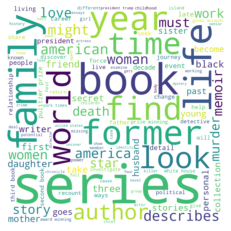

In [57]:
plt.imshow(wordcloud, interpolation='bilInear')
plt.axis('off')
plt.savefig(Path+'/plots/wordcloud_description.png',format = 'png')
plt.show()

In [52]:
Path

'C:/Users/gadge/OneDrive/Desktop/MachineLearning/Project'

In [58]:
df.head()

,Unnamed: 0,Unnamed: 0.1,genre,published_date,rank,rank_last_week,weeks_on_list,publisher,description,title,author_x,authors,#authors,primary_author,secondary_author,author_wiki,Genre,Original_publication,author_y,born,occupation,author_desc,Original_publication_date,Original_publication_Year,Author_DOB,published_year,Age_book,Age_author
0,0,0,combined-print-and-e-book-fiction,2020-08-30,1,1,101,Putnam,In a quiet town on the North Carolina coast in...,WHERE THE CRAWDADS SING,Delia Owens,['Delia Owens'],1,Delia Owens,NaN,Delia Owens,Literary fiction,"August 14, 2018[1]",Delia Owens,c. 1949,Authorzoologistconservationist,Delia Owens (born c. 1949)[1] is an American a...,2018-08-14 00:00:00,2018.0,1949.0,2020,2.0,69.0
1,1,1,combined-print-and-e-book-fiction,2020-08-30,2,0,1,Putnam,The 54th book in the Stone Barrington series. ...,CHOPPY WATER,Stuart Woods,['Stuart Woods'],1,Stuart Woods,NaN,NaN,NaN,NaN,Stuart Woods,"(1938-01-09)January 9, 1938Manchester, Georgia...",Novelist,"Stuart Woods (January 9, 1938 – July 22, 2022)...",None,NaN,1938.0,2020,NaN,NaN
2,2,2,combined-print-and-e-book-fiction,2020-08-30,3,0,1,Grand Central,A single mom teams up with an N.Y.P.D. detecti...,THE MIDWIFE MURDERS,James Patterson and Richard DiLallo,"['James Patterson', 'Richard DiLallo']",2,James Patterson,Richard DiLallo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,2020,NaN,NaN
3,3,3,combined-print-and-e-book-fiction,2020-08-30,4,0,1,Simon & Schuster,The 23rd book in the Dave Robicheaux series. R...,A PRIVATE CATHEDRAL,James Lee Burke,['James Lee Burke'],1,James Lee Burke,NaN,NaN,NaN,NaN,James Lee Burke,"(1936-12-05) December 5, 1936 (age 86)Houston...","Writer, novelist","James Lee Burke (born December 5, 1936) is an ...",None,NaN,1936.0,2020,NaN,NaN
4,4,4,combined-print-and-e-book-fiction,2020-08-30,5,2,11,Riverhead,The lives of twin sisters who run away from a ...,THE VANISHING HALF,Brit Bennett,['Brit Bennett'],1,Brit Bennett,NaN,Brit Bennett,Historical fictionfamily sagamystery,"June 2, 2020",Brit Bennett,"1989/1990 (age 32–33)Oceanside, California",Writer,Brit Bennett is an American writer based in Lo...,2020-06-02 00:00:00,2020.0,1989.0,2020,0.0,31.0


In [61]:
df = df.iloc[:,2:]

In [62]:
df.to_csv((file_path+"/NYTimesBestsellers_clean_data.csv"),index = False)